In [1]:
%pylab inline
from libs import vgg16
import tensorflow as tf
from libs import gif

Populating the interactive namespace from numpy and matplotlib


## Preprocess image: 

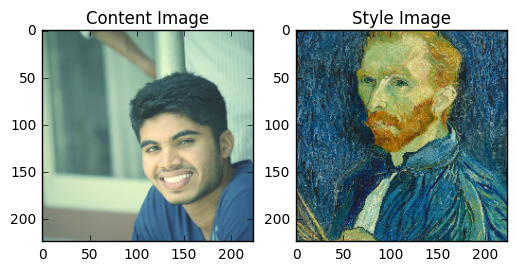

In [2]:
net = vgg16.get_vgg_model()
device = '/cpu:0'
g = tf.Graph()

with tf.Session(graph=g) as sess, g.device(device):
    tf.import_graph_def(net['graph_def'], name='net')
    
content_og = plt.imread('images/vij1.jpg')[..., :3]
style_og = plt.imread('images/vangho.JPG')[..., :3]
content_img = net['preprocess'](content_og)[np.newaxis]
style_img = net['preprocess'](style_og)[np.newaxis]
fig, axs = plt.subplots(1, 2)
axs[0].imshow(content_img[0])
axs[0].set_title('Content Image')
axs[0].grid('off')
axs[1].imshow(style_img[0])
axs[1].set_title('Style Image')
axs[1].grid('off')

## Store the content image features

In [3]:
names = [op.name for op in g.get_operations()]
content_layer = 'net/conv3_2/conv3_2:0'
x = g.get_tensor_by_name(names[0]+":0")

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    content_features = g.get_tensor_by_name(content_layer).eval(
            session=sess,
            feed_dict={x: content_img,
                'net/dropout_1/random_uniform:0': [[1.0]],
                'net/dropout/random_uniform:0': [[1.0]]})

## Store style image features

In [4]:
style_layers = ['net/conv1_1/conv1_1:0',
                'net/conv2_1/conv2_1:0',
                'net/conv3_1/conv3_1:0',
                'net/conv4_1/conv4_1:0',
                'net/conv5_1/conv5_1:0']
style_activations = []

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    for style_i in style_layers:
        style_activation_i = g.get_tensor_by_name(style_i).eval(
            feed_dict={x: style_img,
                    'net/dropout_1/random_uniform:0': [[1.0]],
                    'net/dropout/random_uniform:0': [[1.0]]})
        style_activations.append(style_activation_i)
    
style_features = []
for style_activation_i in style_activations:
    s_i = np.reshape(style_activation_i, [-1, style_activation_i.shape[-1]])
    gram_matrix = np.matmul(s_i.T, s_i) / s_i.size
    style_features.append(gram_matrix.astype(np.float32))

## Input a random variable or  the conatent image to update its values during training

In [5]:
tf.reset_default_graph()
g = tf.Graph()
net = vgg16.get_vgg_model()

# Load up a session which we'll use to import the graph into.
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    # We can set the `net_input` to our content image
    # or perhaps another image
    # or an image of noise
#     net_input = tf.Variable(content_img / 255.0)
    net_input = tf.get_variable(
       name='input',
       shape=content_img.shape,
       dtype=tf.float32,
       initializer=tf.random_normal_initializer(
           mean=np.mean(content_img), stddev=np.std(content_img)))
    
    # Now we load the network again, but this time replacing our placeholder
    # with the trainable tf.Variable
    tf.import_graph_def(
        net['graph_def'],
        name='net',
        input_map={'images:0': net_input})

## Compute content loss : present tensor - previously computed content img features

In [6]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    content_loss = tf.nn.l2_loss((g.get_tensor_by_name(content_layer) -
                                 content_features) /
                                 content_features.size)

## Compute style loss : gram_matrix(style features) - gram_matrix(present tensor or feature)

In [7]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    style_loss = np.float32(0.0)
    for style_layer_i, style_gram_i in zip(style_layers, style_features):
        layer_i = g.get_tensor_by_name(style_layer_i)
        layer_shape = layer_i.get_shape().as_list()
        layer_size = layer_shape[1] * layer_shape[2] * layer_shape[3]
        layer_flat = tf.reshape(layer_i, [-1, layer_shape[3]])
        gram_matrix = tf.matmul(tf.transpose(layer_flat), layer_flat) / layer_size
        style_loss = tf.add(style_loss, tf.nn.l2_loss((gram_matrix - style_gram_i) / np.float32(style_gram_i.size)))

## Near by pixels loss. nearby pixels should be similar. 

In [8]:
def total_variation_loss(x):
    h, w = x.get_shape().as_list()[1], x.get_shape().as_list()[1]
    dx = tf.square(x[:, :h-1, :w-1, :] - x[:, :h-1, 1:, :])
    dy = tf.square(x[:, :h-1, :w-1, :] - x[:, 1:, :w-1, :])
    return tf.reduce_sum(tf.pow(dx + dy, 1.25))

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    tv_loss = total_variation_loss(net_input)

## Loss & Optimizer

In [9]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    # Experiment w/ the weighting of these!  They produce WILDLY different
    # results.
    loss = 5.0 * content_loss + 1.0 * style_loss + 0.001 * tv_loss
    optimizer = tf.train.AdamOptimizer(0.05).minimize(loss)

## Train

0: 21.351444, (-0.285146 - 1.374355)


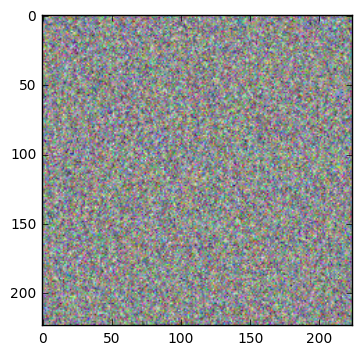

1: 13.899597, (-0.237499 - 1.327343)
2: 9.498987, (-0.191489 - 1.282639)
3: 6.754638, (-0.146595 - 1.238865)
4: 5.389925, (-0.114304 - 1.194860)
5: 4.718278, (-0.149519 - 1.150750)


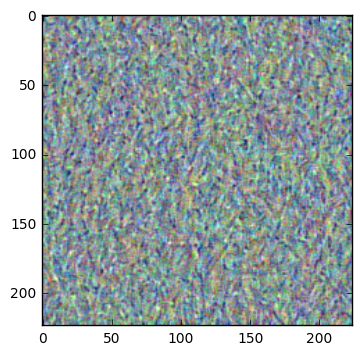

6: 4.259845, (-0.170670 - 1.107548)
7: 3.984295, (-0.180138 - 1.094988)
8: 3.845400, (-0.179607 - 1.089438)
9: 3.730309, (-0.169655 - 1.096383)
10: 3.593145, (-0.152426 - 1.120803)


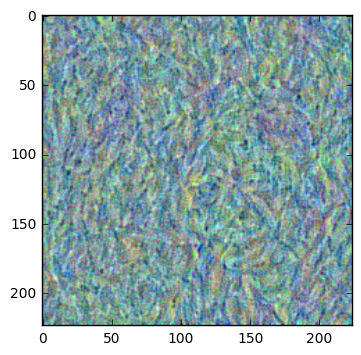

11: 3.452603, (-0.166635 - 1.143816)
12: 3.312731, (-0.197052 - 1.158130)
13: 3.146606, (-0.218949 - 1.163597)
14: 2.959162, (-0.235777 - 1.162781)
15: 2.785226, (-0.251896 - 1.159485)


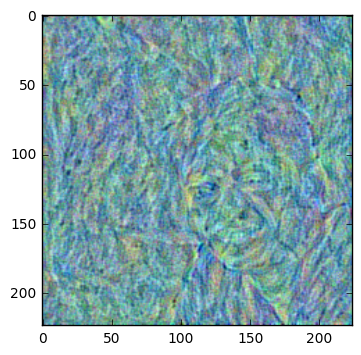

16: 2.636858, (-0.270093 - 1.155460)
17: 2.502881, (-0.289741 - 1.151611)
18: 2.382759, (-0.307643 - 1.145886)
19: 2.284682, (-0.319846 - 1.136053)
20: 2.199967, (-0.323816 - 1.122040)


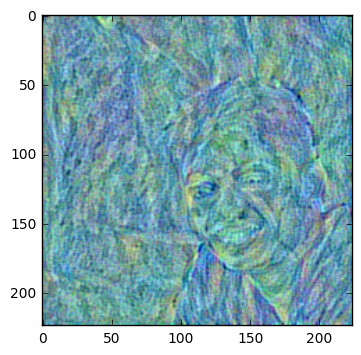

21: 2.115115, (-0.320514 - 1.117232)
22: 2.036231, (-0.313247 - 1.118011)
23: 1.971787, (-0.304577 - 1.119712)
24: 1.915841, (-0.295084 - 1.122217)
25: 1.864148, (-0.283579 - 1.123320)


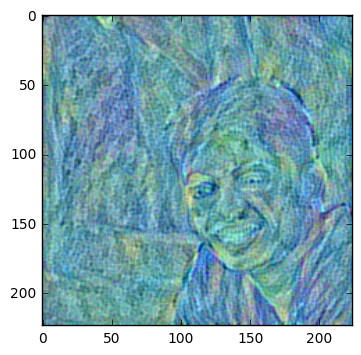

26: 1.820294, (-0.268523 - 1.120046)
27: 1.781402, (-0.249494 - 1.111273)
28: 1.740658, (-0.227621 - 1.099077)
29: 1.701029, (-0.237027 - 1.114968)
30: 1.666453, (-0.247914 - 1.140067)


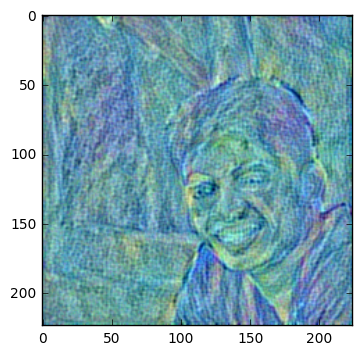

31: 1.633706, (-0.260083 - 1.167926)
32: 1.602042, (-0.272022 - 1.197635)
33: 1.573967, (-0.281939 - 1.228059)
34: 1.547183, (-0.289520 - 1.259041)
35: 1.519710, (-0.295840 - 1.291828)


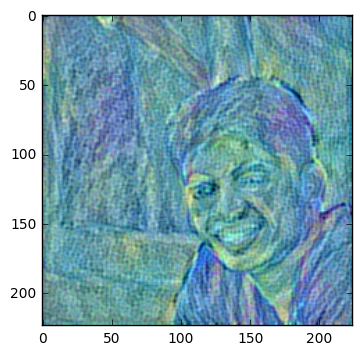

36: 1.494385, (-0.302315 - 1.327548)
37: 1.471426, (-0.309506 - 1.366503)
38: 1.449149, (-0.316624 - 1.407817)
39: 1.428513, (-0.322505 - 1.450628)
40: 1.409661, (-0.326384 - 1.494198)


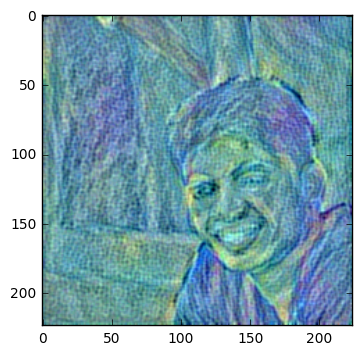

41: 1.390833, (-0.329030 - 1.538746)
42: 1.372856, (-0.331846 - 1.584977)
43: 1.356668, (-0.335554 - 1.633389)
44: 1.341101, (-0.339874 - 1.683399)
45: 1.326339, (-0.343886 - 1.733878)


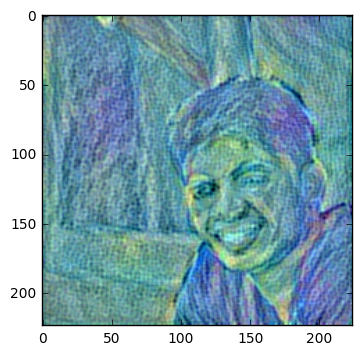

46: 1.312714, (-0.346967 - 1.784192)
47: 1.299221, (-0.349810 - 1.834671)
48: 1.286179, (-0.352880 - 1.886087)
49: 1.274144, (-0.357054 - 1.939001)
50: 1.262471, (-0.361823 - 1.993457)


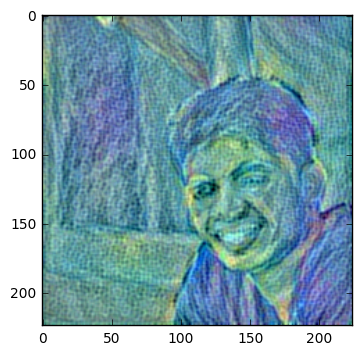

51: 1.251326, (-0.366537 - 2.048927)
52: 1.240826, (-0.370389 - 2.104797)
53: 1.230426, (-0.373469 - 2.161216)
54: 1.220386, (-0.376127 - 2.218571)
55: 1.210893, (-0.378739 - 2.276726)


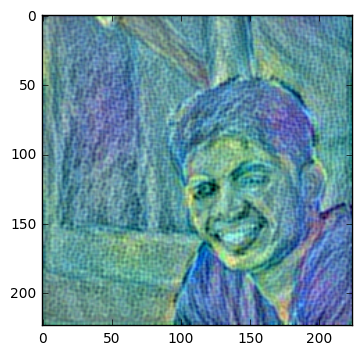

56: 1.201629, (-0.381001 - 2.335073)
57: 1.192767, (-0.382338 - 2.393034)
58: 1.184277, (-0.382631 - 2.450279)
59: 1.175884, (-0.382300 - 2.507050)
60: 1.167799, (-0.382263 - 2.563832)


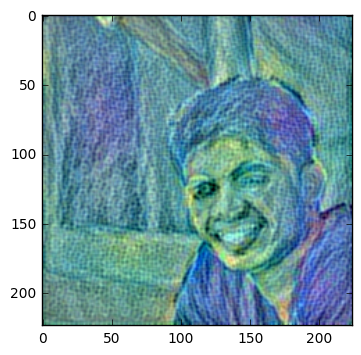

61: 1.159962, (-0.382580 - 2.620674)
62: 1.152281, (-0.382790 - 2.677179)
63: 1.144895, (-0.382124 - 2.733345)
64: 1.137586, (-0.380611 - 2.788985)
65: 1.130395, (-0.378896 - 2.844457)


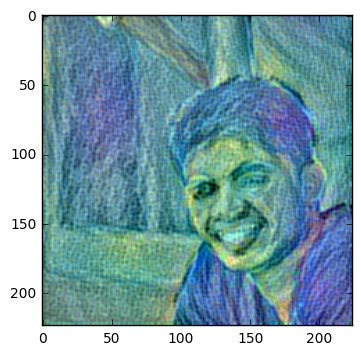

66: 1.123451, (-0.377331 - 2.900112)
67: 1.116638, (-0.375599 - 2.955782)
68: 1.110038, (-0.373222 - 3.010994)
69: 1.103589, (-0.370358 - 3.065650)
70: 1.097210, (-0.367299 - 3.119801)


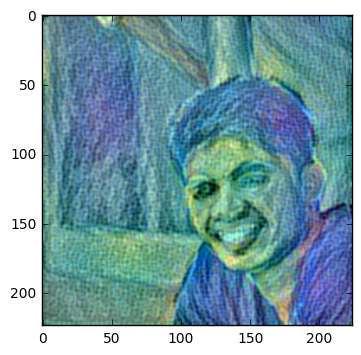

71: 1.091018, (-0.364529 - 3.174548)
72: 1.084947, (-0.361788 - 3.229892)
73: 1.079001, (-0.358633 - 3.284871)
74: 1.073192, (-0.355074 - 3.339328)
75: 1.067456, (-0.351661 - 3.393460)


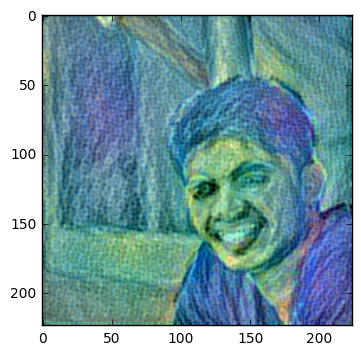

76: 1.061835, (-0.348773 - 3.447104)
77: 1.056306, (-0.346595 - 3.500373)
78: 1.050863, (-0.344810 - 3.553100)
79: 1.045511, (-0.343355 - 3.605120)
80: 1.040211, (-0.342263 - 3.656569)


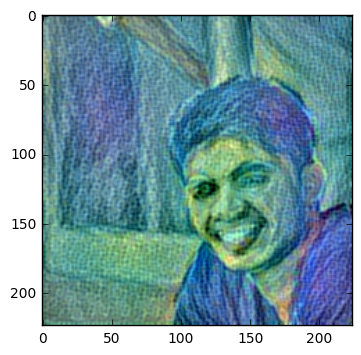

81: 1.034976, (-0.341592 - 3.707624)
82: 1.029780, (-0.341206 - 3.758322)
83: 1.024657, (-0.340892 - 3.808443)
84: 1.019624, (-0.340418 - 3.857796)
85: 1.014625, (-0.339861 - 3.906494)


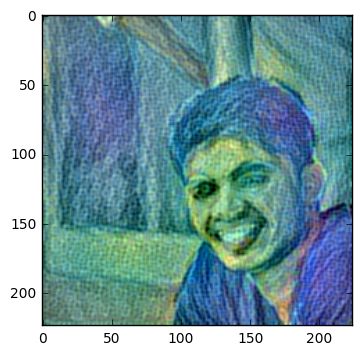

86: 1.009670, (-0.339354 - 3.954968)
87: 1.004748, (-0.338618 - 4.003107)
88: 0.999863, (-0.337138 - 4.050496)
89: 0.995055, (-0.335012 - 4.097082)
90: 0.990278, (-0.332400 - 4.142849)


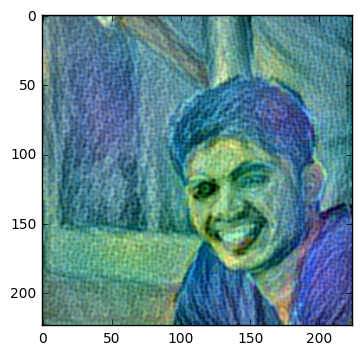

91: 0.985558, (-0.329203 - 4.188110)
92: 0.980884, (-0.325589 - 4.232688)
93: 0.976246, (-0.321742 - 4.276744)
94: 0.971649, (-0.318158 - 4.320004)
95: 0.967101, (-0.315122 - 4.362508)


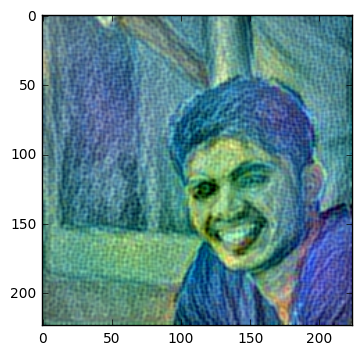

96: 0.962601, (-0.312711 - 4.404473)
97: 0.958151, (-0.310955 - 4.445633)
98: 0.953736, (-0.309310 - 4.485773)
99: 0.949341, (-0.307462 - 4.524894)
100: 0.944987, (-0.305360 - 4.563214)


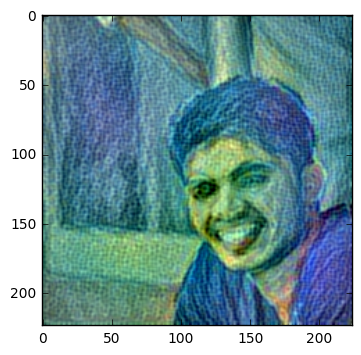

101: 0.940696, (-0.303364 - 4.600865)
102: 0.936467, (-0.301341 - 4.637683)
103: 0.932280, (-0.305433 - 4.673652)
104: 0.928130, (-0.311346 - 4.708824)
105: 0.924043, (-0.317475 - 4.742889)


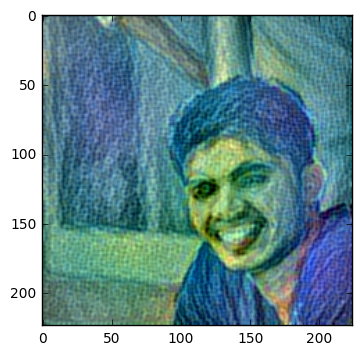

106: 0.920004, (-0.322972 - 4.775921)
107: 0.916005, (-0.327266 - 4.807907)
108: 0.912068, (-0.330817 - 4.838862)
109: 0.908188, (-0.333305 - 4.869068)
110: 0.904353, (-0.335122 - 4.898288)


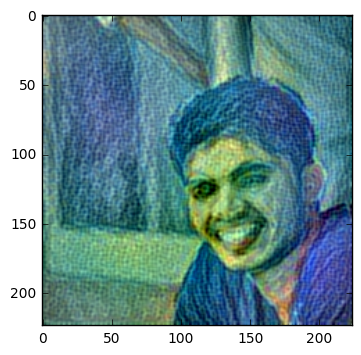

111: 0.900593, (-0.335251 - 4.926696)
112: 0.896905, (-0.335500 - 4.954233)
113: 0.893263, (-0.336111 - 4.980877)
114: 0.889685, (-0.337066 - 5.006649)
115: 0.886158, (-0.337414 - 5.031459)


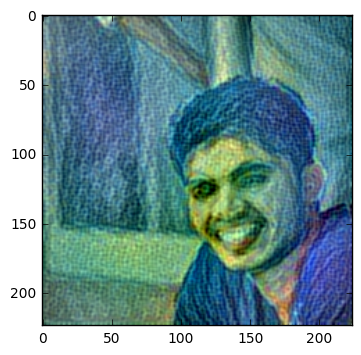

116: 0.882698, (-0.336876 - 5.055527)
117: 0.879293, (-0.335432 - 5.078835)
118: 0.875945, (-0.333510 - 5.101640)
119: 0.872648, (-0.332202 - 5.123650)
120: 0.869405, (-0.330685 - 5.144912)


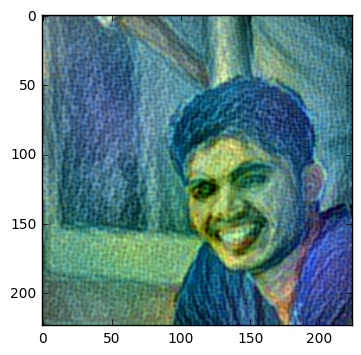

121: 0.866218, (-0.329342 - 5.165305)
122: 0.863108, (-0.328183 - 5.184809)
123: 0.860055, (-0.325957 - 5.203397)
124: 0.857075, (-0.322228 - 5.221395)
125: 0.854161, (-0.318026 - 5.238956)


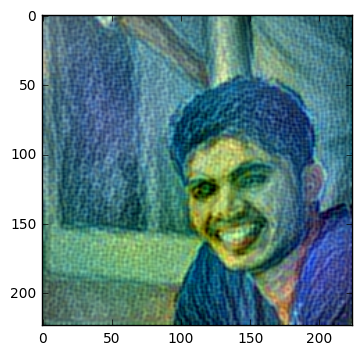

126: 0.851317, (-0.314517 - 5.256258)
127: 0.848529, (-0.310844 - 5.273075)
128: 0.845799, (-0.306571 - 5.289114)
129: 0.843117, (-0.302011 - 5.304590)
130: 0.840486, (-0.299008 - 5.319047)


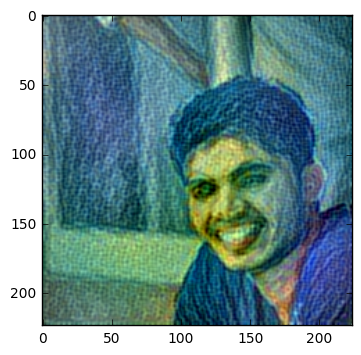

131: 0.837922, (-0.300897 - 5.332576)
132: 0.835425, (-0.302335 - 5.345199)
133: 0.832959, (-0.303583 - 5.357025)
134: 0.830539, (-0.304839 - 5.367986)
135: 0.828186, (-0.305796 - 5.378210)


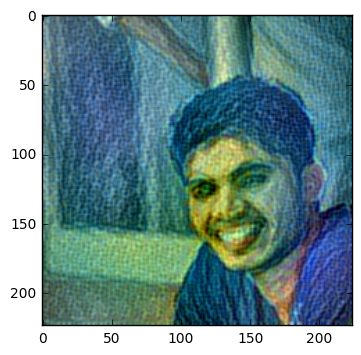

136: 0.825889, (-0.306769 - 5.387754)
137: 0.823640, (-0.307977 - 5.396820)
138: 0.821447, (-0.309569 - 5.405389)
139: 0.819311, (-0.311556 - 5.413474)
140: 0.817216, (-0.313896 - 5.420966)


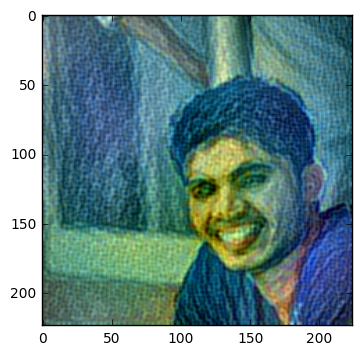

141: 0.815179, (-0.316574 - 5.428039)
142: 0.813196, (-0.319623 - 5.434421)
143: 0.811257, (-0.322790 - 5.439886)
144: 0.809363, (-0.325994 - 5.444412)
145: 0.807529, (-0.329088 - 5.448453)


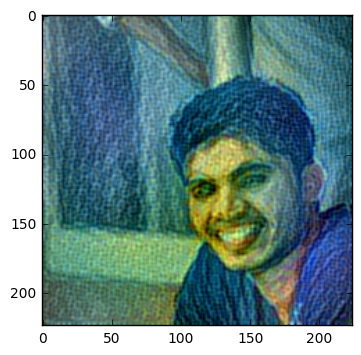

146: 0.805755, (-0.332081 - 5.452022)
147: 0.804037, (-0.334862 - 5.454984)
148: 0.802376, (-0.337819 - 5.457366)
149: 0.800761, (-0.340273 - 5.459252)
150: 0.799194, (-0.342189 - 5.460557)


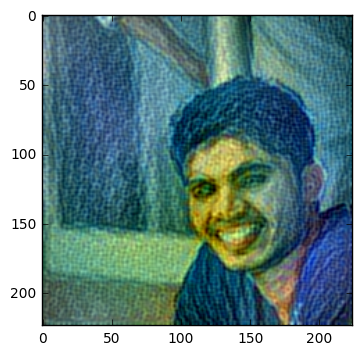

151: 0.797677, (-0.343428 - 5.461381)
152: 0.796205, (-0.344409 - 5.461805)
153: 0.794786, (-0.345803 - 5.461869)
154: 0.793419, (-0.347427 - 5.461297)
155: 0.792089, (-0.349184 - 5.460003)


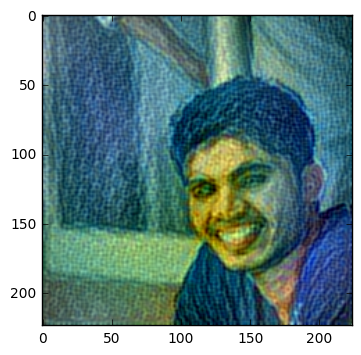

156: 0.790803, (-0.351052 - 5.458002)
157: 0.789559, (-0.353089 - 5.455445)
158: 0.788356, (-0.355608 - 5.452436)
159: 0.787185, (-0.358402 - 5.449043)
160: 0.786061, (-0.361819 - 5.445219)


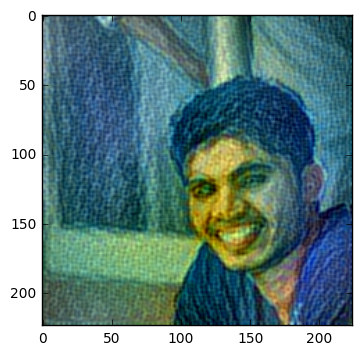

161: 0.784974, (-0.365157 - 5.440945)
162: 0.783909, (-0.368297 - 5.436171)
163: 0.782874, (-0.370651 - 5.431037)
164: 0.781864, (-0.371958 - 5.425640)
165: 0.780881, (-0.372180 - 5.419975)


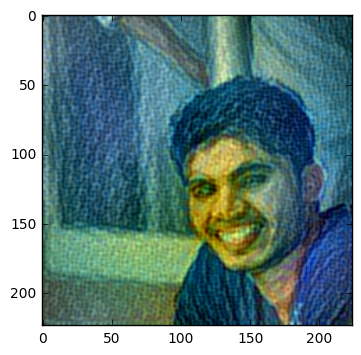

166: 0.779928, (-0.372072 - 5.414073)
167: 0.779009, (-0.372287 - 5.407936)
168: 0.778121, (-0.372782 - 5.401744)
169: 0.777264, (-0.373715 - 5.395430)
170: 0.776437, (-0.374976 - 5.389159)


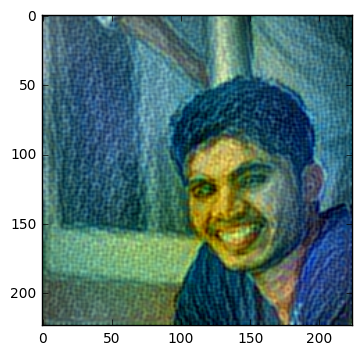

171: 0.775643, (-0.376421 - 5.383408)
172: 0.774876, (-0.377772 - 5.378179)
173: 0.774138, (-0.378810 - 5.373089)
174: 0.773404, (-0.379257 - 5.367785)
175: 0.772703, (-0.378936 - 5.362399)


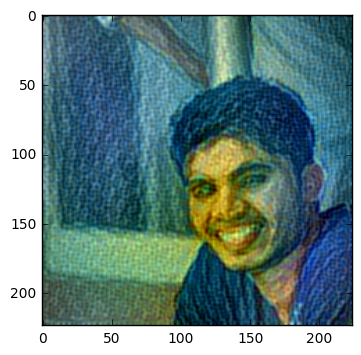

176: 0.772021, (-0.377867 - 5.356948)
177: 0.771350, (-0.376435 - 5.351636)
178: 0.770697, (-0.375012 - 5.346523)
179: 0.770065, (-0.373614 - 5.341516)
180: 0.769450, (-0.372251 - 5.336408)


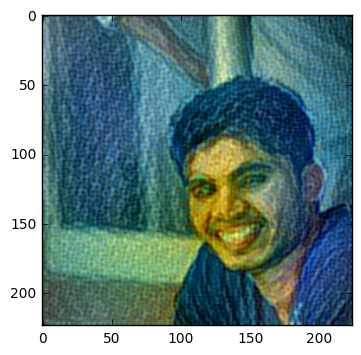

181: 0.768858, (-0.371054 - 5.331345)
182: 0.768284, (-0.370279 - 5.326563)
183: 0.767716, (-0.369937 - 5.322084)
184: 0.767164, (-0.370145 - 5.317984)
185: 0.766626, (-0.370987 - 5.314139)


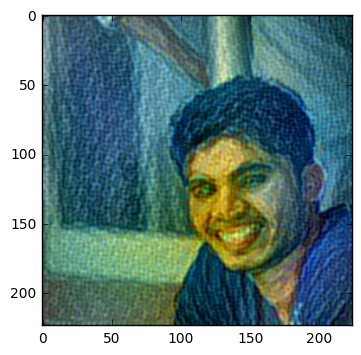

186: 0.766098, (-0.372209 - 5.310430)
187: 0.765584, (-0.373438 - 5.306896)
188: 0.765097, (-0.374642 - 5.303750)
189: 0.764618, (-0.375786 - 5.300834)
190: 0.764154, (-0.376957 - 5.298007)


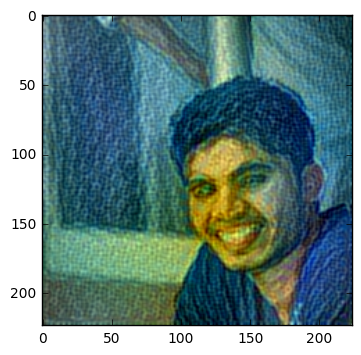

191: 0.763703, (-0.378062 - 5.295570)
192: 0.763266, (-0.379315 - 5.293561)
193: 0.762830, (-0.380665 - 5.291914)
194: 0.762414, (-0.381824 - 5.290251)
195: 0.761998, (-0.382488 - 5.288569)


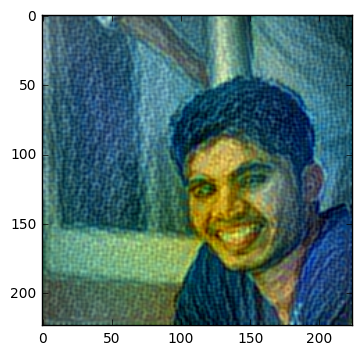

196: 0.761595, (-0.382614 - 5.287094)
197: 0.761194, (-0.382589 - 5.285984)
198: 0.760808, (-0.382599 - 5.285248)
199: 0.760427, (-0.382628 - 5.284532)
200: 0.760049, (-0.382873 - 5.283438)


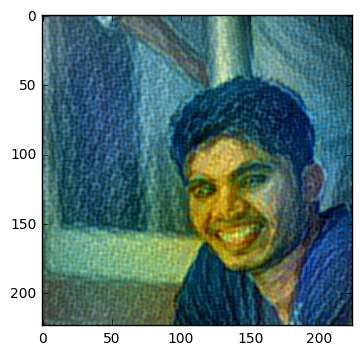

201: 0.759689, (-0.383238 - 5.282072)
202: 0.759343, (-0.383407 - 5.280588)
203: 0.759007, (-0.383321 - 5.279418)
204: 0.758673, (-0.383519 - 5.278580)
205: 0.758339, (-0.383746 - 5.277870)


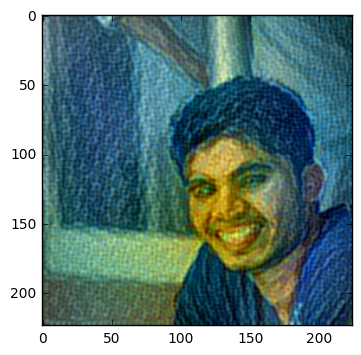

206: 0.758026, (-0.384386 - 5.276820)
207: 0.757719, (-0.384901 - 5.275397)
208: 0.757425, (-0.384971 - 5.273750)
209: 0.757133, (-0.384877 - 5.272084)
210: 0.756848, (-0.384916 - 5.270310)


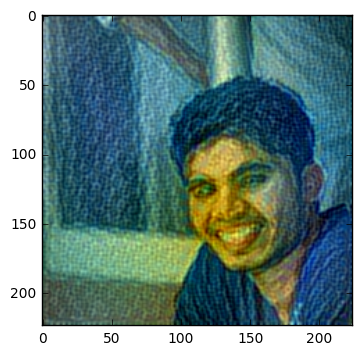

211: 0.756567, (-0.384775 - 5.268262)
212: 0.756291, (-0.384502 - 5.265849)
213: 0.756016, (-0.384275 - 5.263251)
214: 0.755746, (-0.383832 - 5.260509)
215: 0.755491, (-0.383393 - 5.257513)


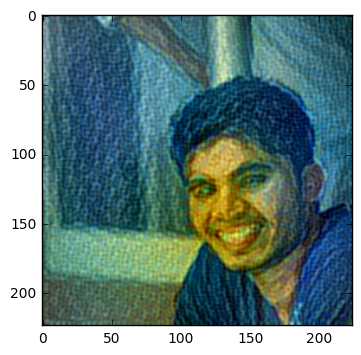

216: 0.755239, (-0.382820 - 5.254452)
217: 0.754990, (-0.382028 - 5.251153)
218: 0.754745, (-0.381366 - 5.247619)
219: 0.754504, (-0.381044 - 5.243917)
220: 0.754273, (-0.380805 - 5.240056)


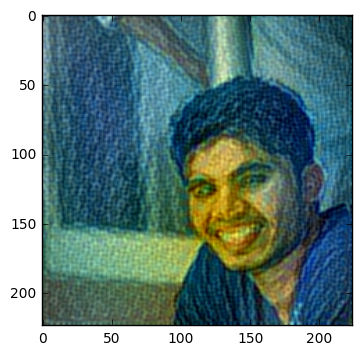

221: 0.754046, (-0.380441 - 5.235975)
222: 0.753820, (-0.380176 - 5.231914)
223: 0.753594, (-0.379706 - 5.228077)
224: 0.753374, (-0.378215 - 5.224669)
225: 0.753163, (-0.376614 - 5.221696)


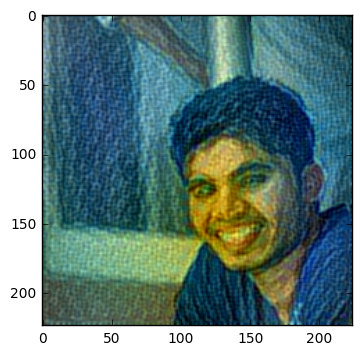

226: 0.752951, (-0.375672 - 5.219049)
227: 0.752739, (-0.374724 - 5.216284)
228: 0.752533, (-0.373484 - 5.213362)
229: 0.752331, (-0.372282 - 5.210703)
230: 0.752137, (-0.371039 - 5.207977)


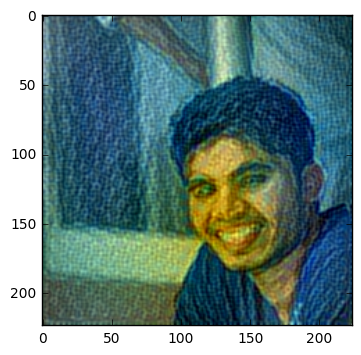

231: 0.751940, (-0.369668 - 5.205084)
232: 0.751751, (-0.368766 - 5.202499)
233: 0.751568, (-0.368492 - 5.200338)
234: 0.751386, (-0.368382 - 5.198595)
235: 0.751207, (-0.368108 - 5.196917)


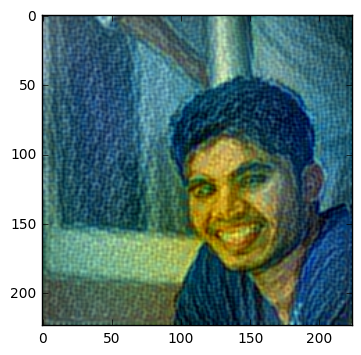

236: 0.751031, (-0.367566 - 5.195167)
237: 0.750858, (-0.366884 - 5.193020)
238: 0.750686, (-0.366181 - 5.190700)
239: 0.750521, (-0.365295 - 5.188163)
240: 0.750362, (-0.364231 - 5.185638)


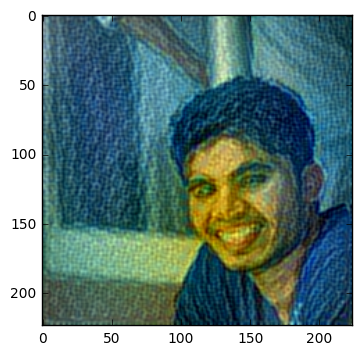

241: 0.750204, (-0.362990 - 5.183575)
242: 0.750047, (-0.361592 - 5.181752)
243: 0.749890, (-0.360031 - 5.180216)
244: 0.749740, (-0.358270 - 5.178971)
245: 0.749585, (-0.356305 - 5.177952)


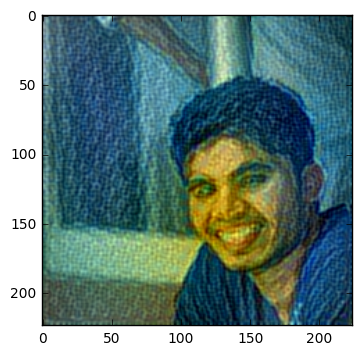

246: 0.749443, (-0.354390 - 5.177123)
247: 0.749297, (-0.352915 - 5.176046)
248: 0.749145, (-0.352155 - 5.174789)
249: 0.749003, (-0.352448 - 5.173522)
250: 0.748865, (-0.353467 - 5.172412)


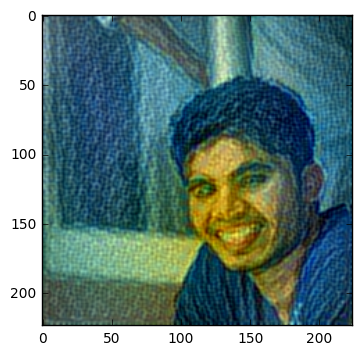

251: 0.748721, (-0.354111 - 5.171618)
252: 0.748590, (-0.354128 - 5.170863)
253: 0.748457, (-0.353673 - 5.170043)
254: 0.748324, (-0.352737 - 5.169292)
255: 0.748197, (-0.351516 - 5.168893)


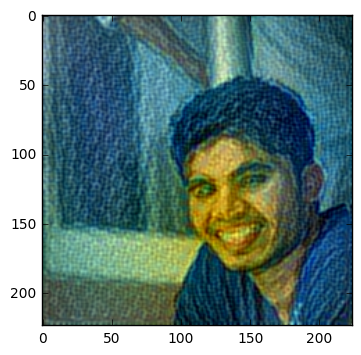

256: 0.748073, (-0.350164 - 5.168848)
257: 0.747951, (-0.348896 - 5.168776)
258: 0.747830, (-0.347620 - 5.168506)
259: 0.747712, (-0.346725 - 5.168711)
260: 0.747597, (-0.346088 - 5.168927)


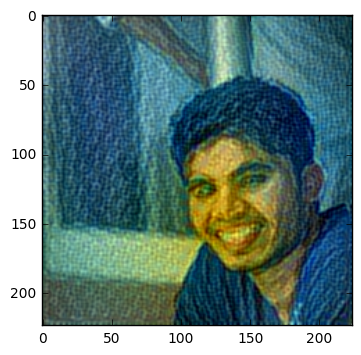

261: 0.747490, (-0.345523 - 5.169411)
262: 0.747379, (-0.344808 - 5.170017)
263: 0.747275, (-0.343813 - 5.170399)
264: 0.747165, (-0.342365 - 5.170385)
265: 0.747064, (-0.340772 - 5.170460)


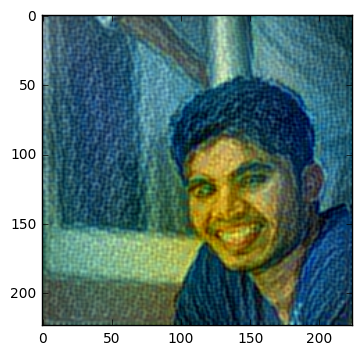

266: 0.746960, (-0.339453 - 5.170918)
267: 0.746855, (-0.338748 - 5.171615)
268: 0.746756, (-0.338438 - 5.172521)
269: 0.746653, (-0.337650 - 5.173519)
270: 0.746552, (-0.336273 - 5.174333)


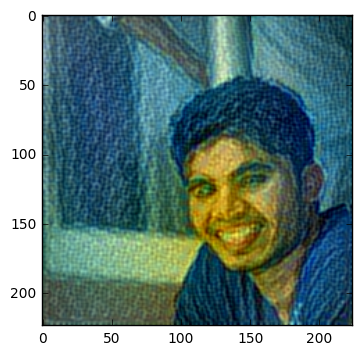

271: 0.746455, (-0.335339 - 5.175379)
272: 0.746361, (-0.335225 - 5.176369)
273: 0.746260, (-0.335180 - 5.177702)
274: 0.746169, (-0.334727 - 5.179250)
275: 0.746080, (-0.333357 - 5.180742)


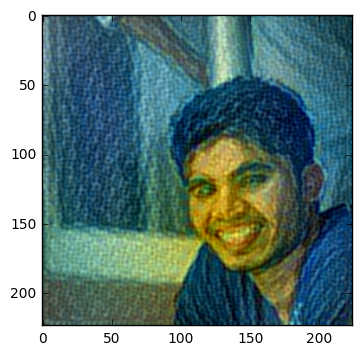

276: 0.745989, (-0.332338 - 5.181641)
277: 0.745901, (-0.332140 - 5.181938)
278: 0.745817, (-0.331566 - 5.181982)
279: 0.745732, (-0.330747 - 5.182215)
280: 0.745644, (-0.329447 - 5.182417)


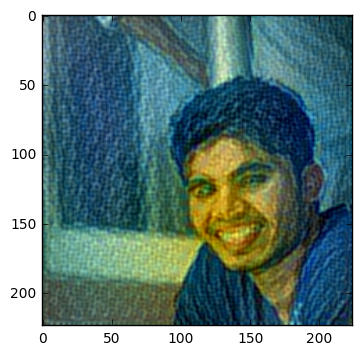

281: 0.745555, (-0.328015 - 5.182744)
282: 0.745471, (-0.326995 - 5.183364)
283: 0.745389, (-0.326372 - 5.183933)
284: 0.745313, (-0.325937 - 5.184226)
285: 0.745231, (-0.325604 - 5.184125)


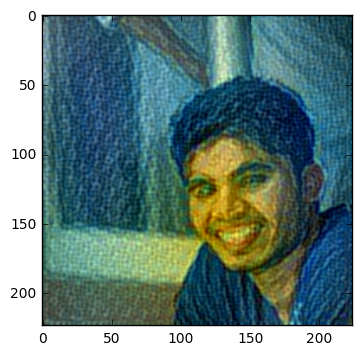

286: 0.745155, (-0.325093 - 5.183984)
287: 0.745079, (-0.324659 - 5.183836)
288: 0.744997, (-0.324057 - 5.183403)
289: 0.744920, (-0.323308 - 5.182981)
290: 0.744847, (-0.322263 - 5.182679)


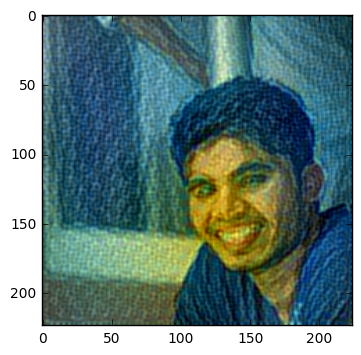

291: 0.744766, (-0.321301 - 5.182677)
292: 0.744696, (-0.320497 - 5.182781)
293: 0.744622, (-0.319807 - 5.182919)
294: 0.744548, (-0.319111 - 5.182989)
295: 0.744466, (-0.318376 - 5.182671)


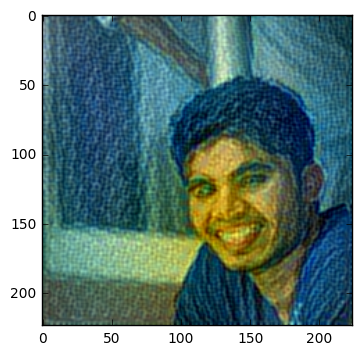

296: 0.744401, (-0.317406 - 5.182119)
297: 0.744332, (-0.316084 - 5.181389)
298: 0.744262, (-0.314813 - 5.180686)
299: 0.744194, (-0.313746 - 5.180203)
300: 0.744126, (-0.312934 - 5.179795)


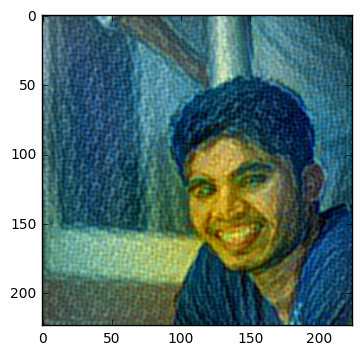

301: 0.744063, (-0.312384 - 5.179002)
302: 0.743991, (-0.312340 - 5.178304)
303: 0.743923, (-0.312611 - 5.177594)
304: 0.743858, (-0.313058 - 5.177017)
305: 0.743791, (-0.313637 - 5.176439)


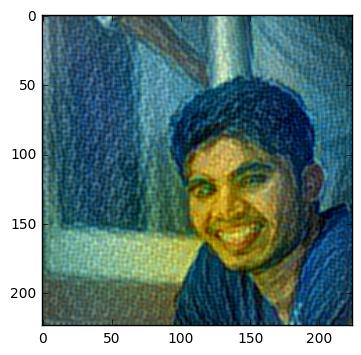

306: 0.743723, (-0.314079 - 5.175961)
307: 0.743654, (-0.314053 - 5.175591)
308: 0.743602, (-0.313358 - 5.175176)
309: 0.743537, (-0.311903 - 5.174514)
310: 0.743472, (-0.310093 - 5.173800)


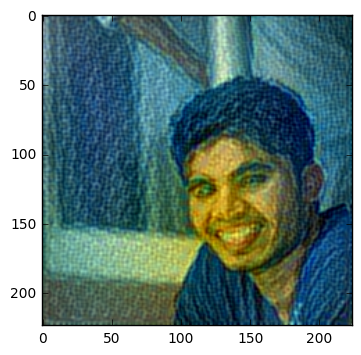

311: 0.743409, (-0.308597 - 5.173106)
312: 0.743340, (-0.307814 - 5.172417)
313: 0.743276, (-0.307281 - 5.171766)
314: 0.743210, (-0.306519 - 5.170978)
315: 0.743142, (-0.305657 - 5.169923)


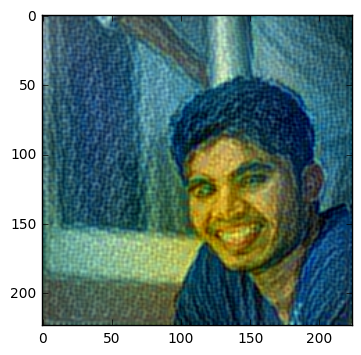

316: 0.743072, (-0.304831 - 5.168972)
317: 0.743004, (-0.304436 - 5.168078)
318: 0.742932, (-0.304579 - 5.167528)
319: 0.742864, (-0.304706 - 5.166770)
320: 0.742802, (-0.304875 - 5.165603)


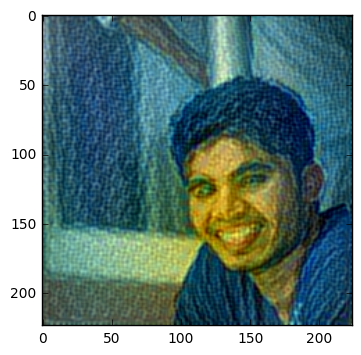

321: 0.742740, (-0.304826 - 5.164374)
322: 0.742685, (-0.304630 - 5.163183)
323: 0.742630, (-0.304231 - 5.161668)
324: 0.742570, (-0.303553 - 5.159999)
325: 0.742514, (-0.302807 - 5.158246)


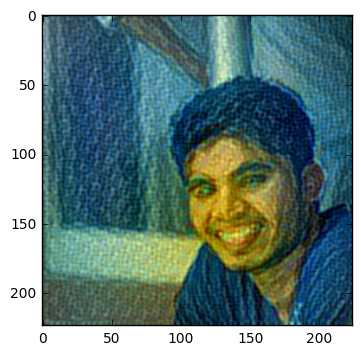

326: 0.742457, (-0.302290 - 5.156745)
327: 0.742407, (-0.302031 - 5.155581)
328: 0.742352, (-0.302100 - 5.154564)
329: 0.742301, (-0.302258 - 5.153282)
330: 0.742251, (-0.302220 - 5.151794)


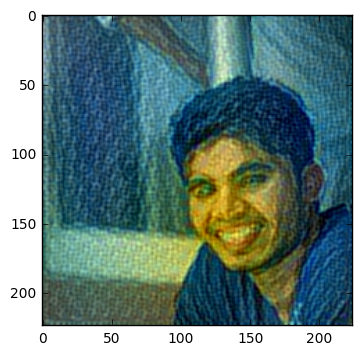

331: 0.742196, (-0.301636 - 5.150247)
332: 0.742150, (-0.300591 - 5.148692)
333: 0.742095, (-0.299152 - 5.147215)
334: 0.742043, (-0.298592 - 5.146084)
335: 0.741995, (-0.298291 - 5.144937)


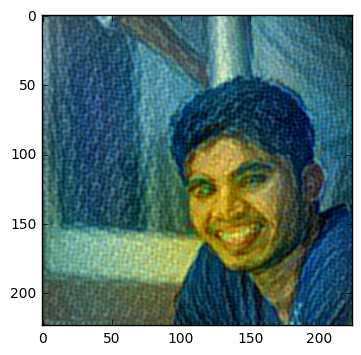

336: 0.741945, (-0.298030 - 5.143449)
337: 0.741901, (-0.297795 - 5.141860)
338: 0.741855, (-0.297227 - 5.140533)
339: 0.741800, (-0.297421 - 5.139228)
340: 0.741761, (-0.297386 - 5.137845)


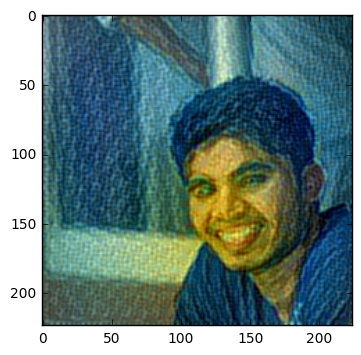

341: 0.741713, (-0.297122 - 5.136772)
342: 0.741666, (-0.296869 - 5.135575)
343: 0.741623, (-0.296446 - 5.134584)
344: 0.741578, (-0.296075 - 5.133397)
345: 0.741535, (-0.295517 - 5.131869)


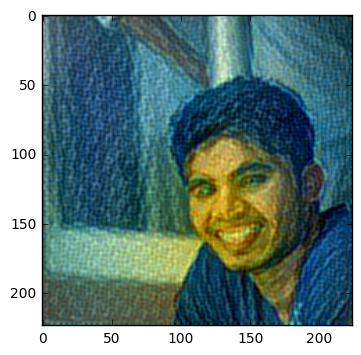

346: 0.741482, (-0.294899 - 5.130318)
347: 0.741439, (-0.294476 - 5.129231)
348: 0.741390, (-0.293886 - 5.128095)
349: 0.741348, (-0.293030 - 5.127032)


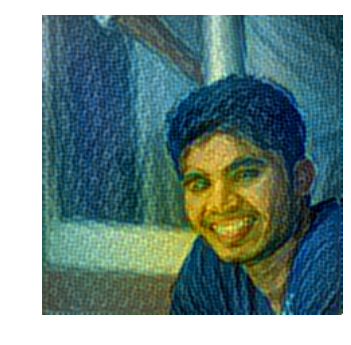

In [10]:
imgs = []
n_iterations = 350

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    sess.run(tf.initialize_all_variables())

    # map input to noise
    og_img = net_input.eval()
    
    for it_i in range(n_iterations):
        _, this_loss, synth = sess.run([optimizer, loss, net_input], feed_dict={
                    'net/dropout_1/random_uniform:0': np.ones(
                        g.get_tensor_by_name(
                            'net/dropout_1/random_uniform:0'
                        ).get_shape().as_list()),
                    'net/dropout/random_uniform:0': np.ones(
                        g.get_tensor_by_name(
                            'net/dropout/random_uniform:0'
                        ).get_shape().as_list())
                })
        print("%d: %f, (%f - %f)" %
            (it_i, this_loss, np.min(synth), np.max(synth)))
        if it_i % 5 == 0:
            m = vgg16.deprocess(synth[0])
            imgs.append(m)
            plt.imshow(m)
            plt.show()
    gif.build_gif(imgs, saveto='stylenet_.gif')

In [13]:
import IPython.display as ipyd
ipyd.Image(url='stylenet_.gif?i=0', height=300, width=300)

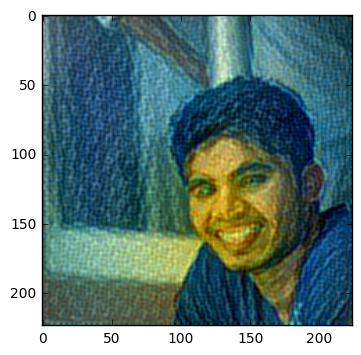

In [17]:
imshow(imgs[len(imgs)-1])